# Wasserstein GAN with Gradient Penalty (WGAN-GP)

## Generator and Critic

#### Packages and Visualizations

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) 

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):  
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):   
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [3]:
class Critic(nn.Module):
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update
  *   device: the device type

In [4]:
n_epochs = 100
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

initializing the generator, critic, and optimizers.

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty

In [20]:
def get_gradient(crit, real, fake, epsilon):
    
    
    mixed_images = real * epsilon + fake * (1 - epsilon)

    
    mixed_scores = crit(mixed_images)
   
    gradient = torch.autograd.grad(
        
        inputs=mixed_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [22]:

def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    print("epsilon",epsilon.shape)
    gradient = get_gradient(crit, real, fake, epsilon)
    print("gradient",gradient.shape)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

epsilon torch.Size([256, 1, 1, 1])
mixed_scores torch.Size([256, 1])
gradient torch.Size([256, 1, 28, 28])
Success!


In [23]:
def gradient_penalty(gradient):
    gradient = gradient.view(len(gradient), -1)
    gradient_norm = gradient.norm(2, dim=1)
    penalty = torch.mean((gradient_norm - 1)**2)
    return penalty

In [24]:
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses

In [28]:

def get_gen_loss(crit_fake_pred):
    gen_loss =  -1. * torch.mean(crit_fake_pred)
    return gen_loss

In [29]:

assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)
assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


In [30]:

def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda * gp
    return crit_loss

In [31]:

assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together

Epoch 1, step 500: Generator loss: 0.7533227373834234, critic loss: -113.41820320487322


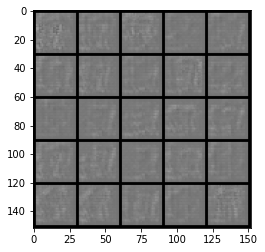

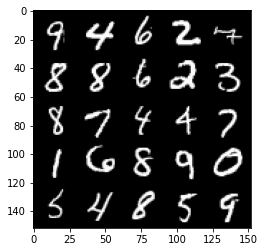

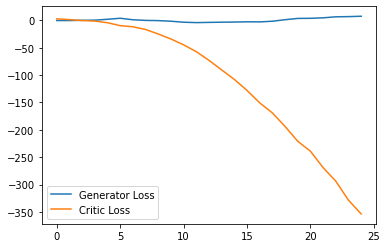

Epoch 2, step 1000: Generator loss: -17.849698258519172, critic loss: -226.6955104522708


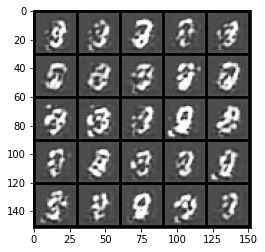

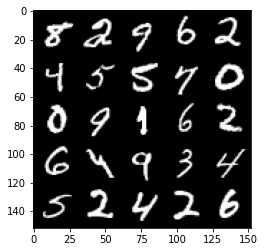

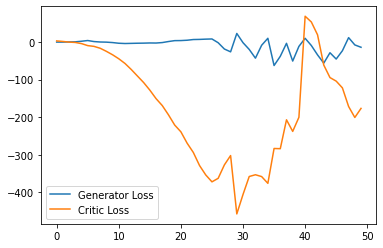

Epoch 3, step 1500: Generator loss: -31.038747697472573, critic loss: -370.62290974884036


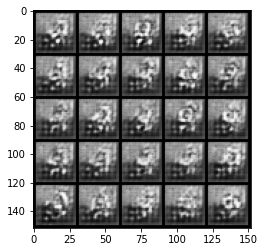

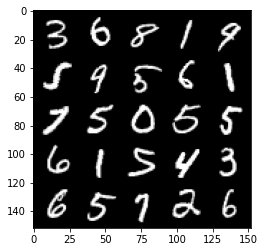

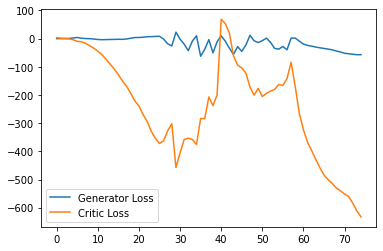

Epoch 4, step 2000: Generator loss: -59.634469606399534, critic loss: -92.63533841781614


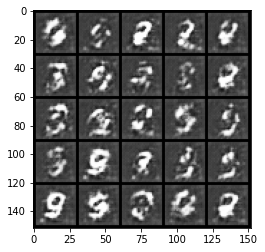

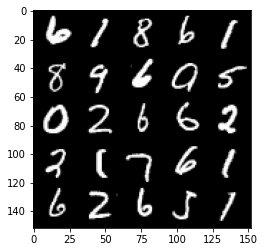

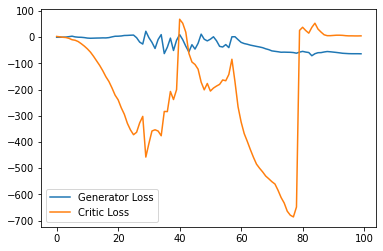

Epoch 5, step 2500: Generator loss: -60.13479607391358, critic loss: 0.8540353540420533


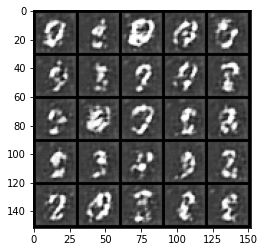

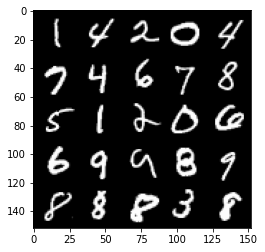

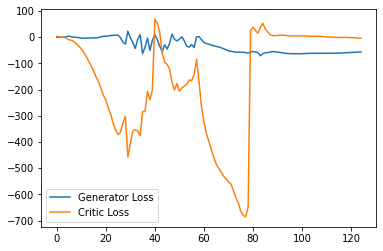

Epoch 6, step 3000: Generator loss: -62.833331329345704, critic loss: -21.217232540321373


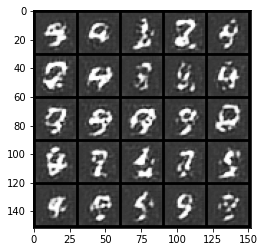

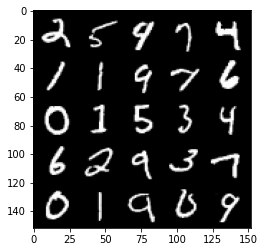

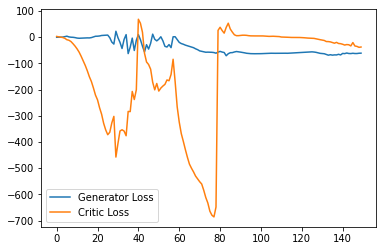

Epoch 7, step 3500: Generator loss: -58.457530271053315, critic loss: -35.604067988967884


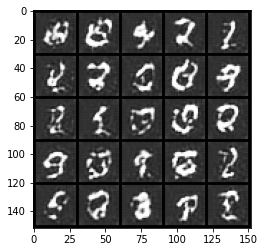

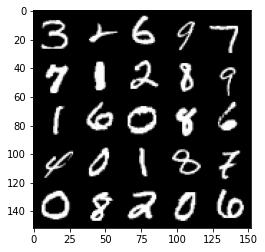

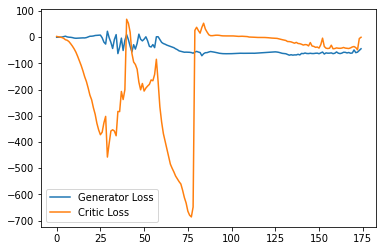

Epoch 8, step 4000: Generator loss: -54.02769218707085, critic loss: -37.420265940284736


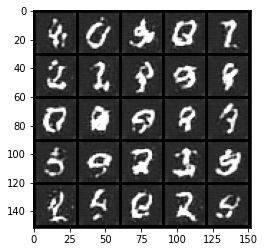

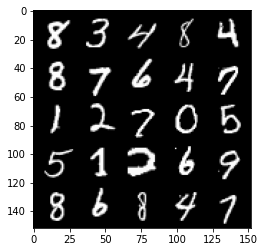

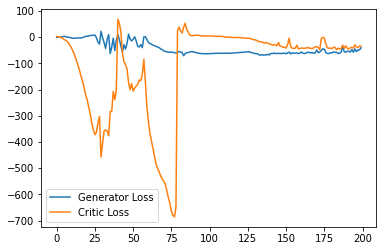

Epoch 9, step 4500: Generator loss: -40.04109504657984, critic loss: -19.549292689323437


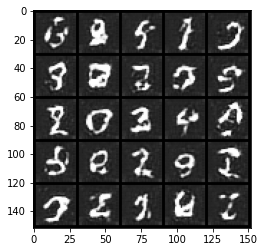

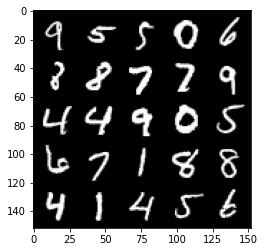

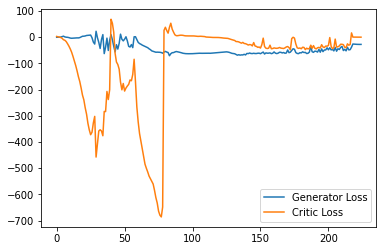

Epoch 10, step 5000: Generator loss: -28.17904168128967, critic loss: -6.622781644439693


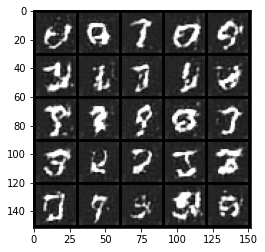

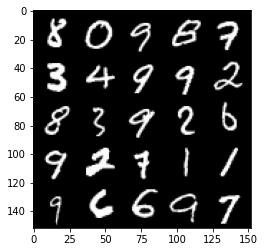

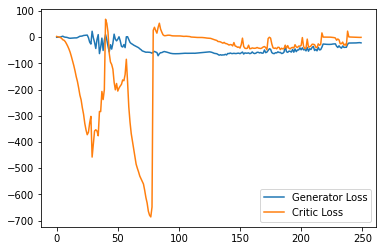

Epoch 11, step 5500: Generator loss: -25.152557384490965, critic loss: -4.323066677570344


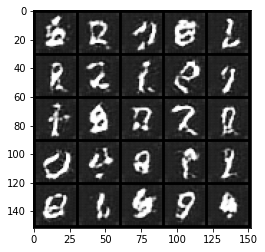

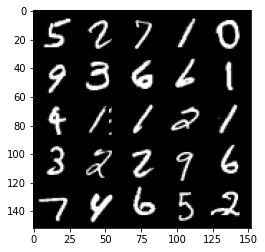

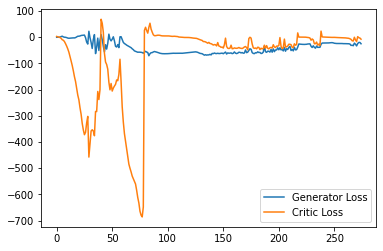

Epoch 12, step 6000: Generator loss: -26.487090012550354, critic loss: -15.632806424140927


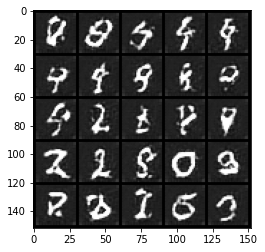

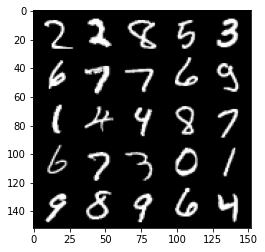

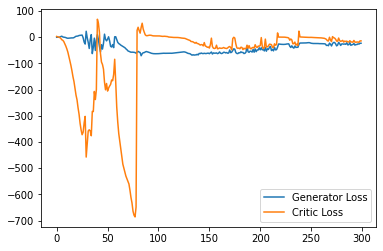

Epoch 13, step 6500: Generator loss: -21.70577392920852, critic loss: -18.387417011451735


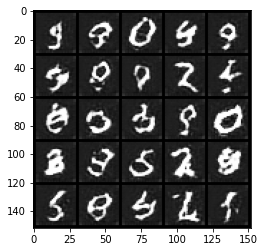

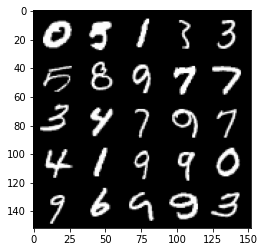

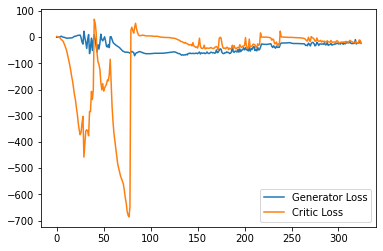

Epoch 14, step 7000: Generator loss: -16.395706769108774, critic loss: -16.59405927181244


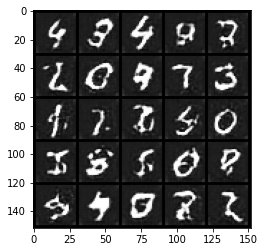

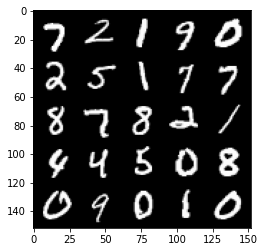

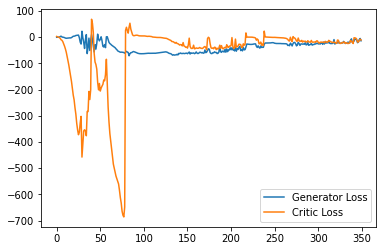

Epoch 15, step 7500: Generator loss: -13.086219127058984, critic loss: -17.122928521871565


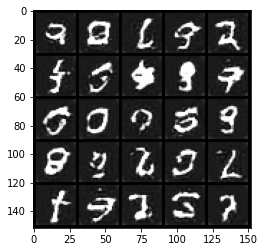

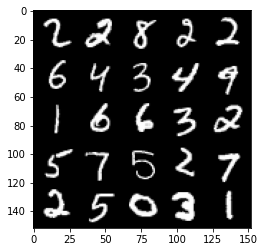

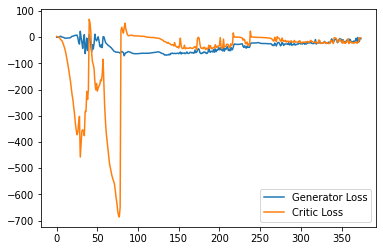

Epoch 17, step 8000: Generator loss: -10.66775533646345, critic loss: -18.510267848205565


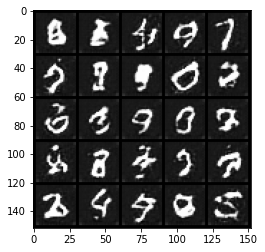

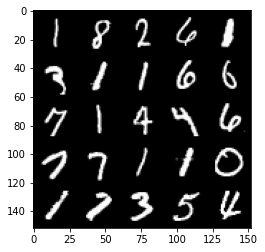

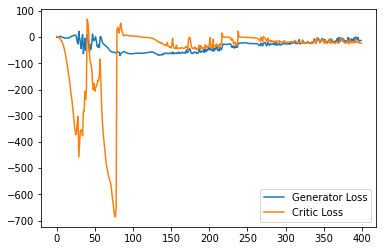

Epoch 18, step 8500: Generator loss: -7.794619652122259, critic loss: -17.52809285254479


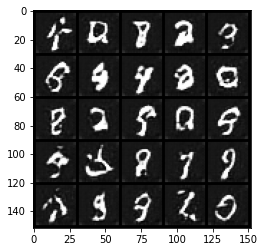

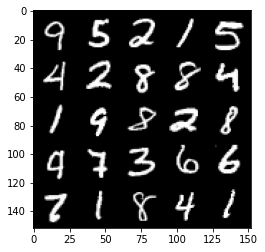

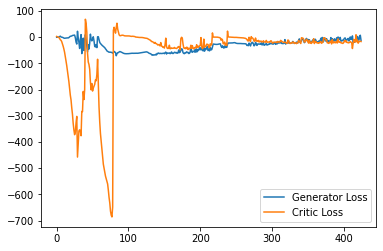

Epoch 19, step 9000: Generator loss: -1.0578891038298608, critic loss: -12.430511571407319


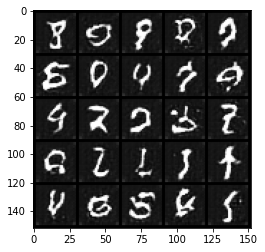

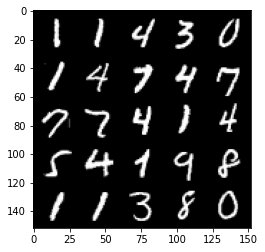

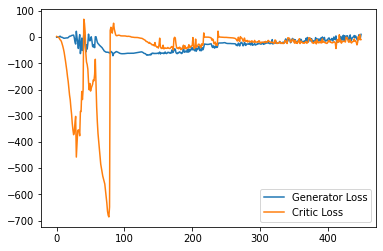

Epoch 20, step 9500: Generator loss: 1.7046599587202071, critic loss: -15.700432668113706


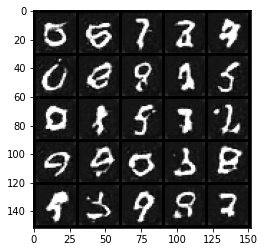

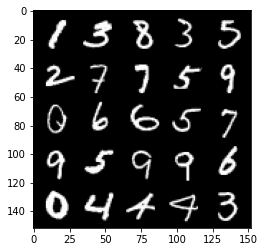

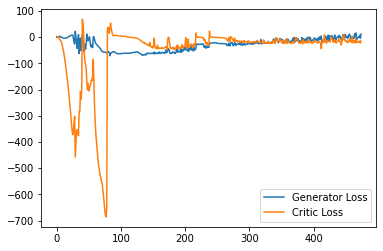

Epoch 21, step 10000: Generator loss: 4.929487436532974, critic loss: -15.133404596352573


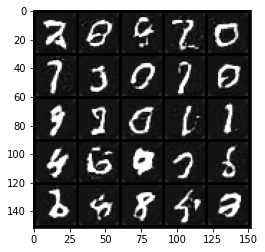

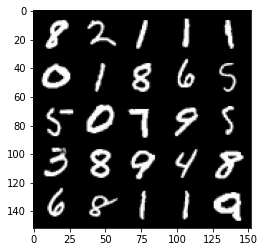

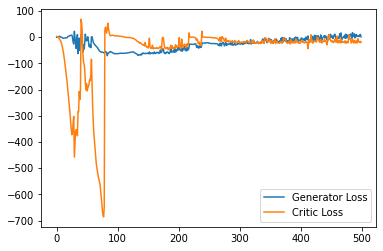

Epoch 22, step 10500: Generator loss: 9.358869196683168, critic loss: -14.895133189773556


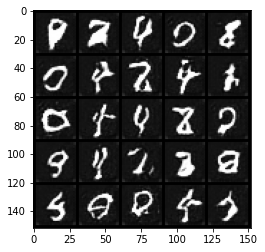

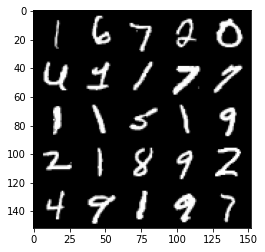

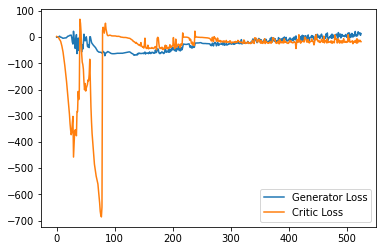

Epoch 23, step 11000: Generator loss: 10.538671719133854, critic loss: -16.59979751887321


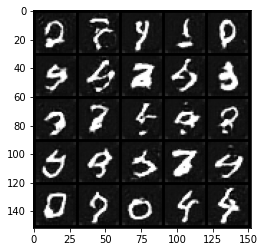

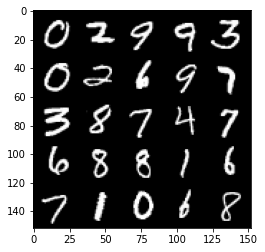

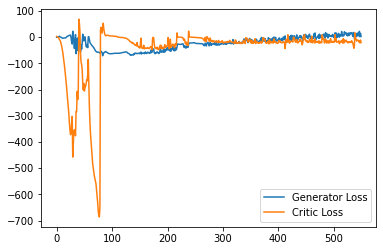

Epoch 24, step 11500: Generator loss: 18.01373301848769, critic loss: -4.1721579435825396


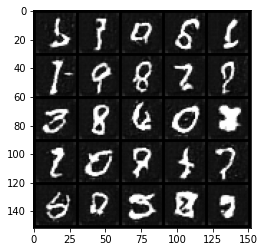

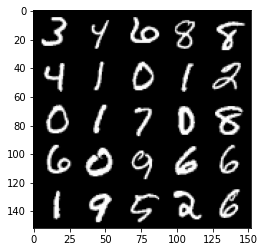

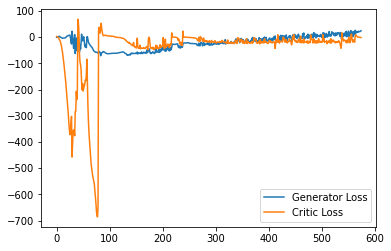

Epoch 25, step 12000: Generator loss: 26.06577017211914, critic loss: -3.5722029774427404


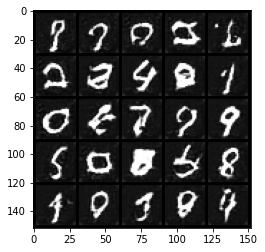

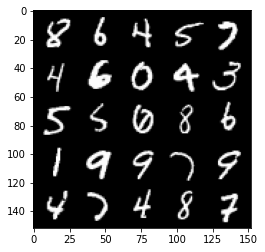

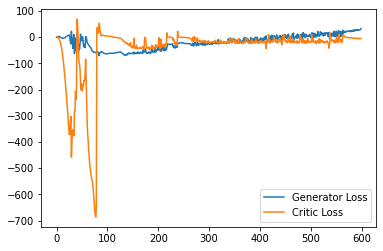

Epoch 26, step 12500: Generator loss: 31.406085720062254, critic loss: -5.053237546300888


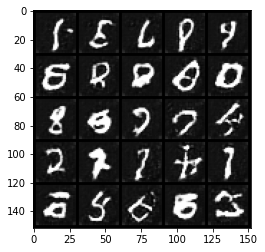

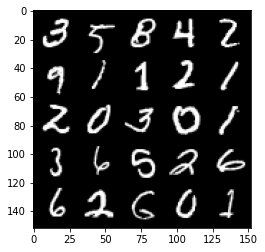

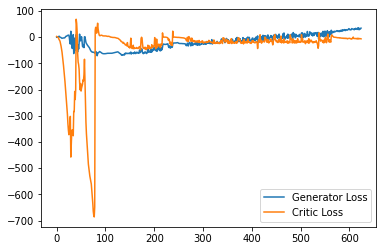

Epoch 27, step 13000: Generator loss: 31.638082611083984, critic loss: -5.439975995826718


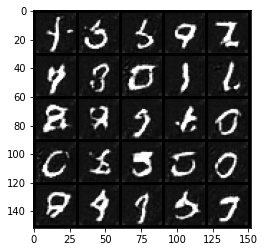

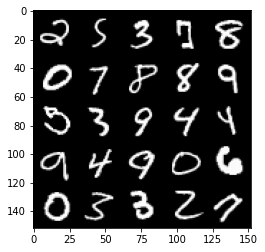

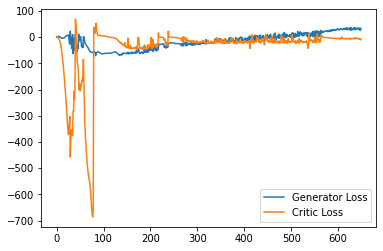

Epoch 28, step 13500: Generator loss: 34.2034690361023, critic loss: -6.476895384109021


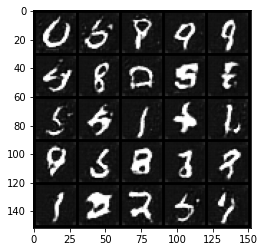

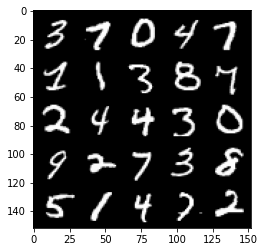

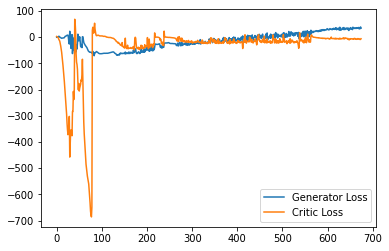

Epoch 29, step 14000: Generator loss: 35.44752116775513, critic loss: -6.8398703039646165


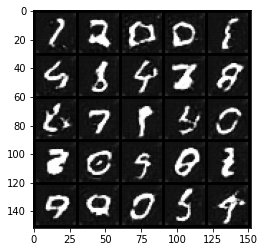

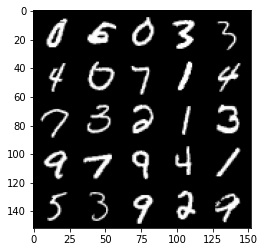

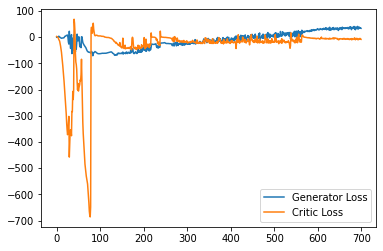

Epoch 30, step 14500: Generator loss: 37.57095652389526, critic loss: -7.178761122471092


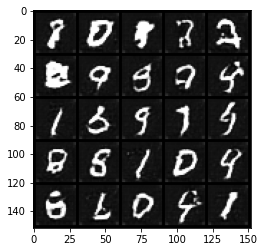

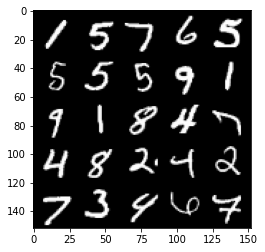

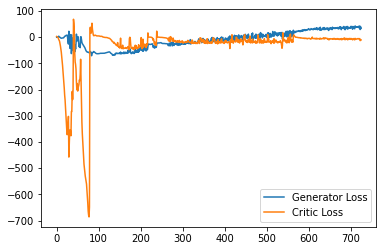

Epoch 31, step 15000: Generator loss: 37.97471304130554, critic loss: -8.203191234660144


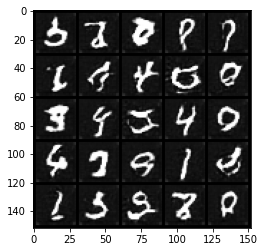

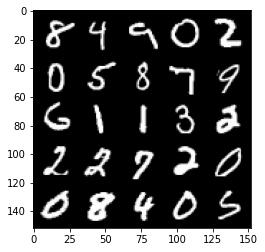

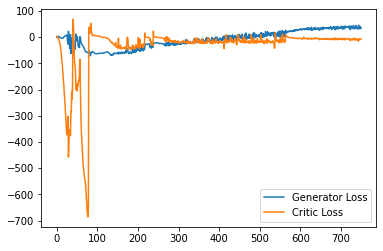

Epoch 33, step 15500: Generator loss: 36.490726484298705, critic loss: -8.537255457556245


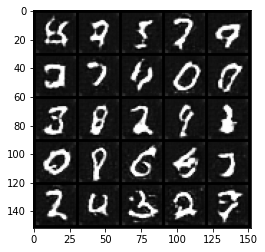

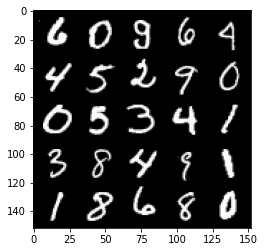

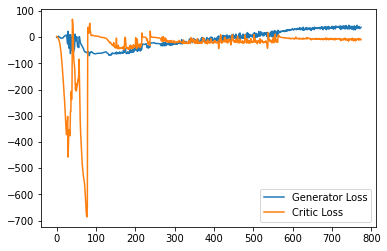

Epoch 34, step 16000: Generator loss: 35.283569774627686, critic loss: -10.12479140870572


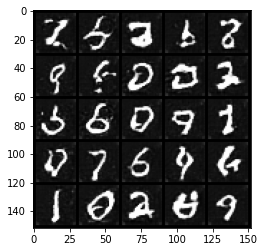

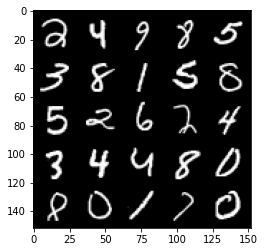

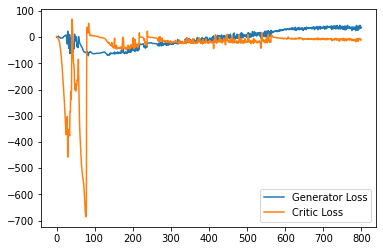

Epoch 35, step 16500: Generator loss: 37.71527652001381, critic loss: -8.256221898770333


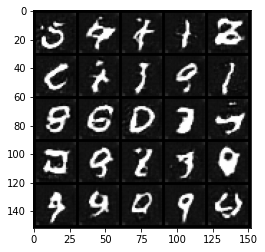

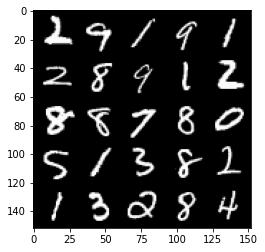

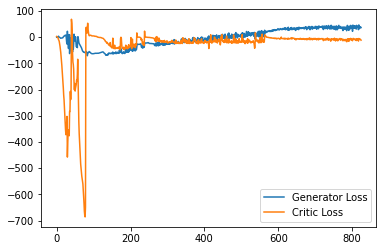

Epoch 36, step 17000: Generator loss: 34.08106649303436, critic loss: -10.396831234288207


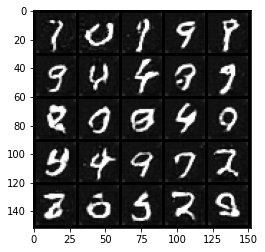

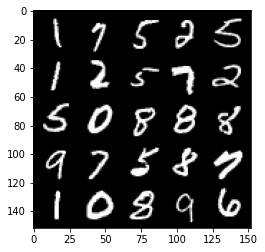

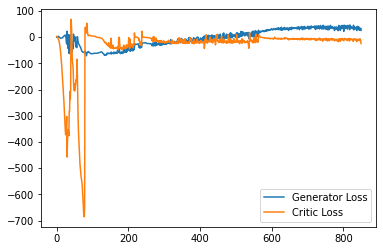

Epoch 37, step 17500: Generator loss: 32.303823341608044, critic loss: -9.042468572759631


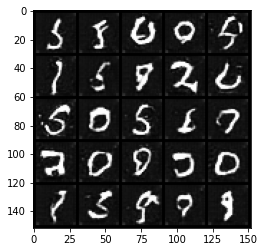

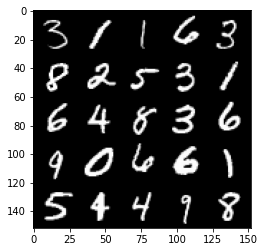

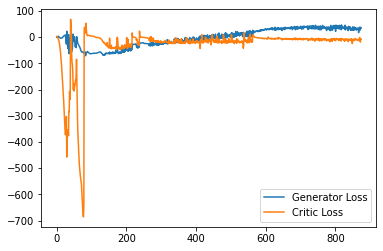

Epoch 38, step 18000: Generator loss: 31.01974861472845, critic loss: -7.556451858937738


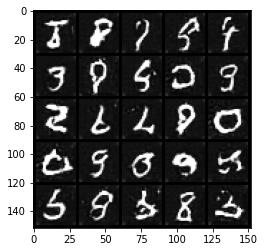

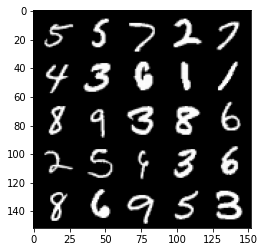

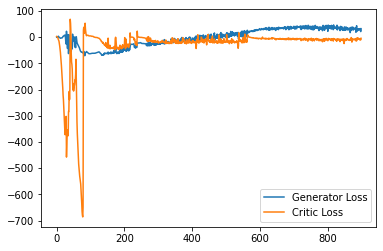

Epoch 39, step 18500: Generator loss: 31.792866878271102, critic loss: -9.443721517622476


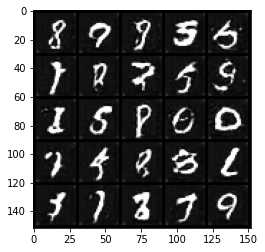

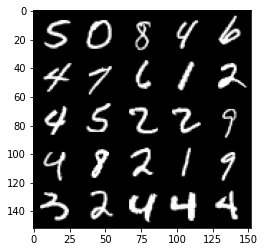

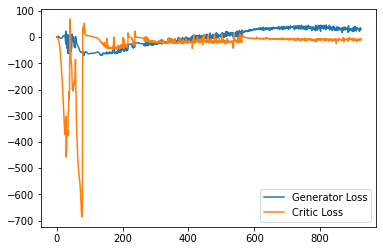

Epoch 40, step 19000: Generator loss: 29.739388049602507, critic loss: -10.560407412028312


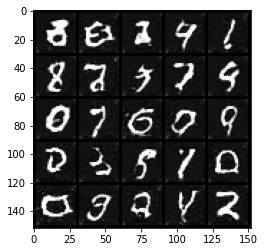

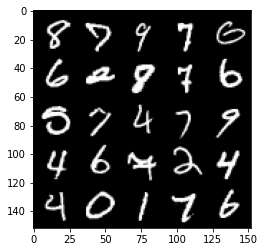

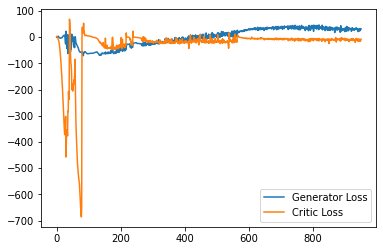

Epoch 41, step 19500: Generator loss: 27.340271330356597, critic loss: -10.431024926376345


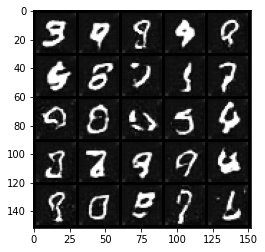

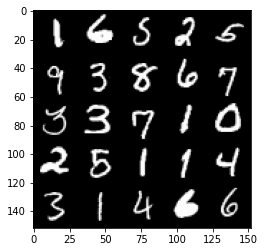

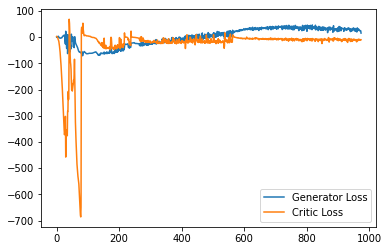

Epoch 42, step 20000: Generator loss: 25.209392018020154, critic loss: -8.97602345809937


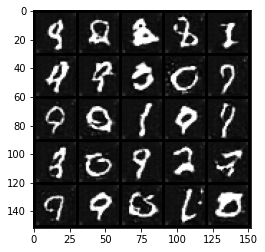

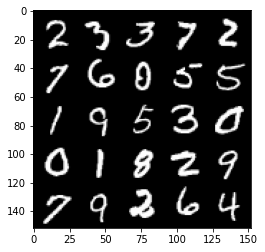

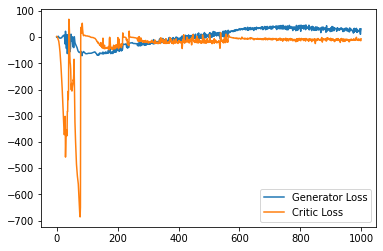

Epoch 43, step 20500: Generator loss: 22.294373618125917, critic loss: -9.895493061995507


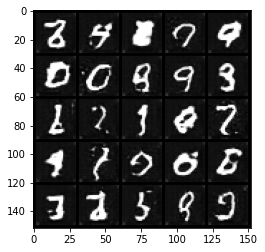

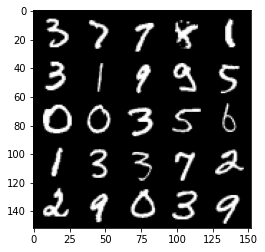

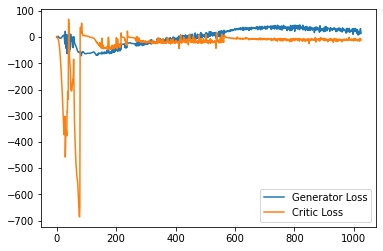

Epoch 44, step 21000: Generator loss: 21.76738315154612, critic loss: -10.395207451987268


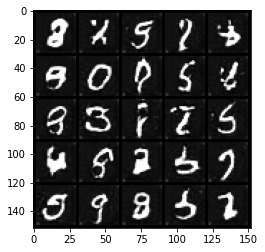

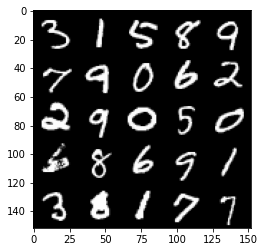

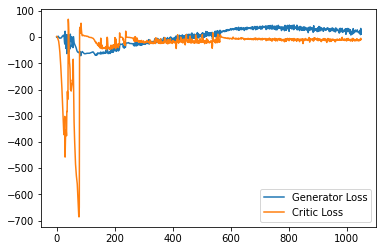

Epoch 45, step 21500: Generator loss: 17.97235008096695, critic loss: -11.393034725975992


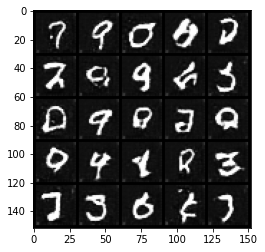

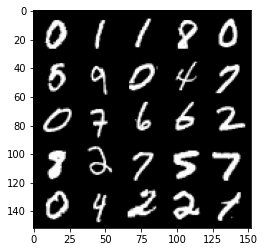

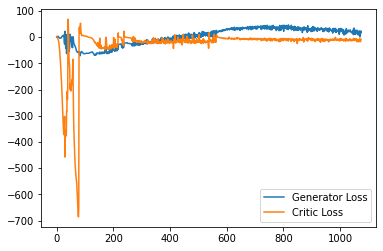

Epoch 46, step 22000: Generator loss: 15.526544332683086, critic loss: -8.895297813653947


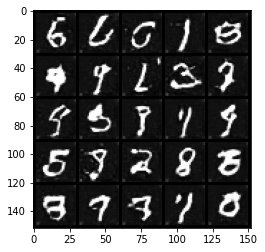

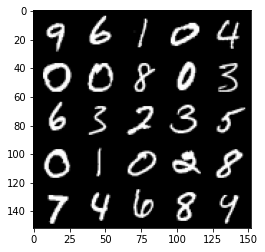

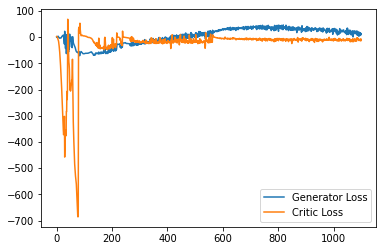

Epoch 47, step 22500: Generator loss: 9.042997617319227, critic loss: -10.785030794072146


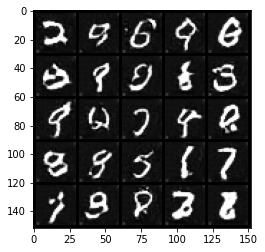

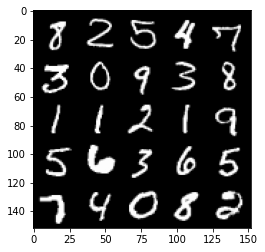

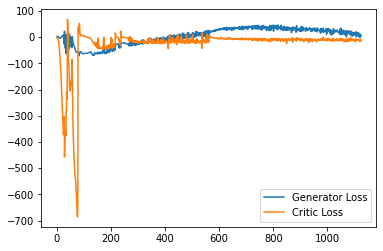

Epoch 49, step 23000: Generator loss: 6.601712888062, critic loss: -10.46490159074069


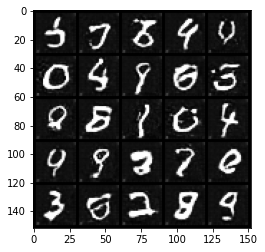

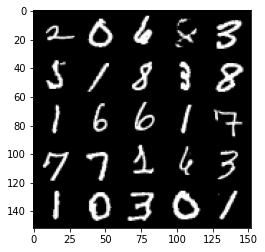

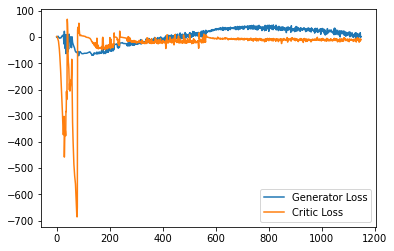

Epoch 50, step 23500: Generator loss: 3.3784676215201617, critic loss: -10.066522657072543


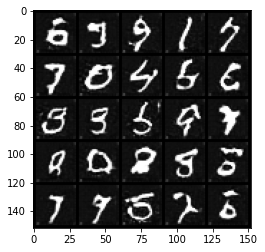

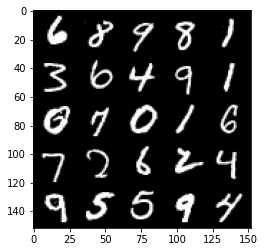

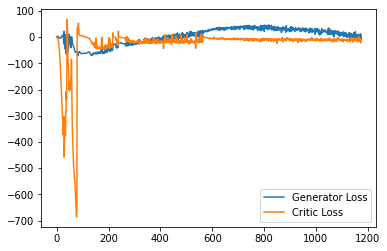

Epoch 51, step 24000: Generator loss: -2.997138939142227, critic loss: -10.878398400819316


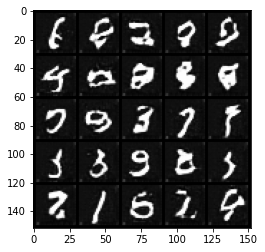

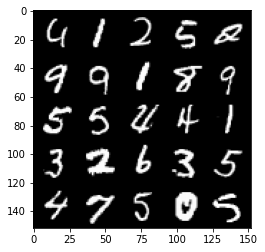

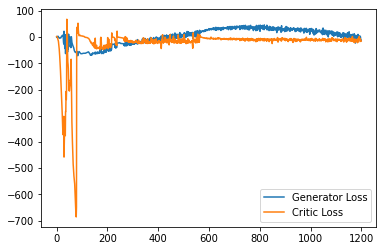

Epoch 52, step 24500: Generator loss: -1.2879481349661945, critic loss: -11.642138681262727


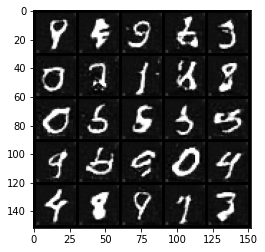

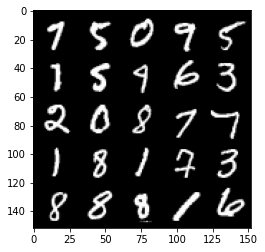

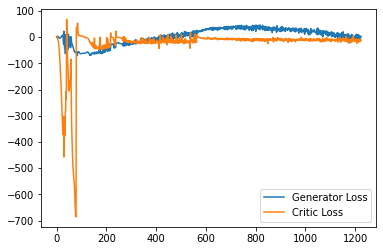

Epoch 53, step 25000: Generator loss: -2.077337928056717, critic loss: -11.932792781770239


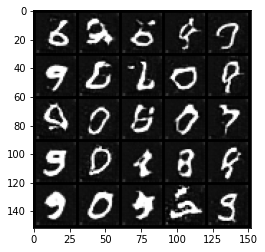

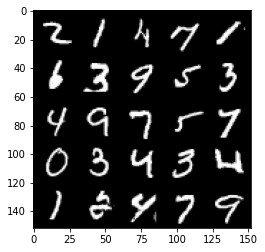

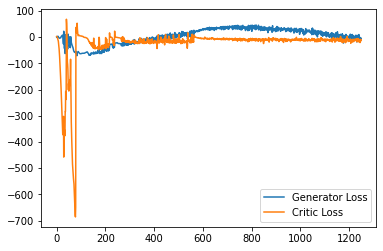

Epoch 54, step 25500: Generator loss: -6.4252993683815, critic loss: -9.96667121506929


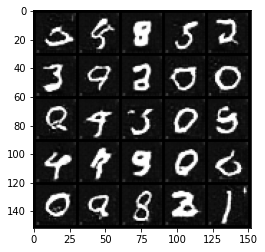

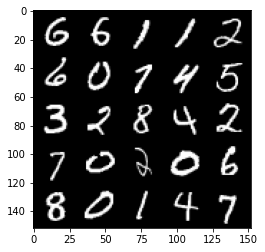

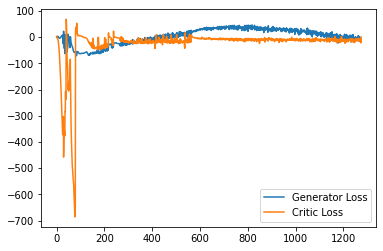

Epoch 55, step 26000: Generator loss: -10.844834641098975, critic loss: -11.572722861587991


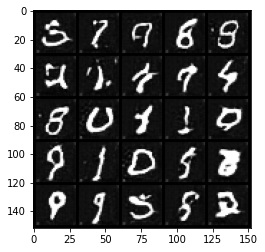

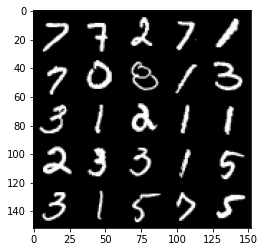

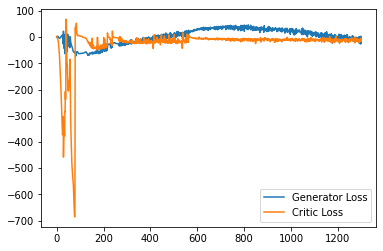

Epoch 56, step 26500: Generator loss: -14.282043684780598, critic loss: -11.378404464685913


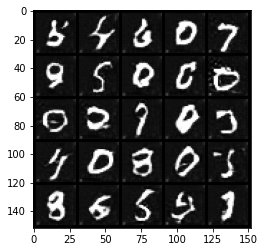

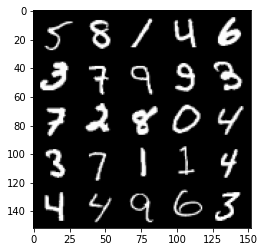

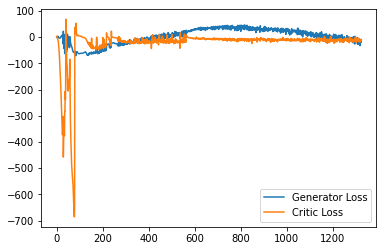

Epoch 57, step 27000: Generator loss: -19.959612035766245, critic loss: -11.455706713938707


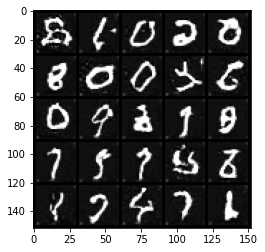

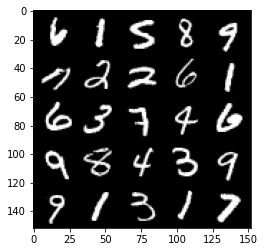

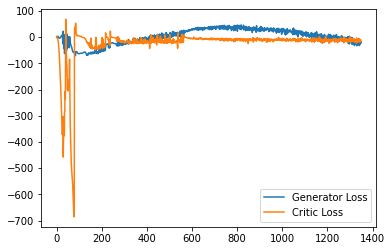

Epoch 58, step 27500: Generator loss: -20.738735573202373, critic loss: -11.796364583992954


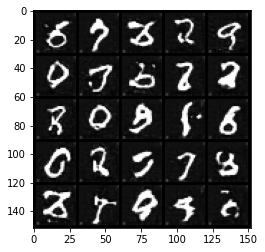

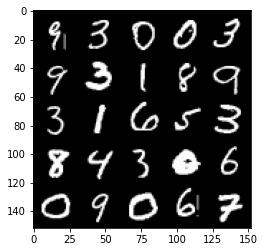

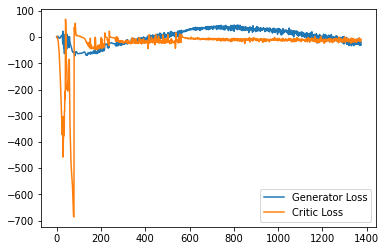

Epoch 59, step 28000: Generator loss: -27.17777333752811, critic loss: -11.733091457355021


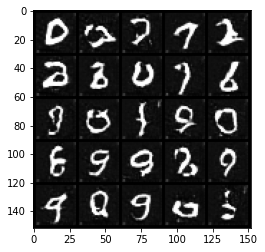

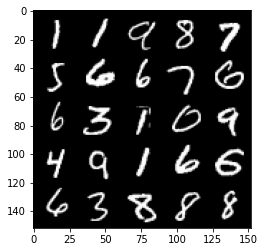

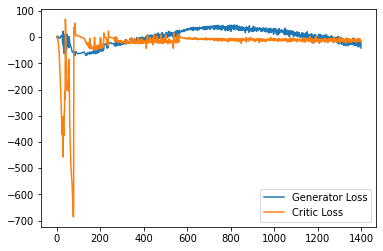

Epoch 60, step 28500: Generator loss: -30.630028518259525, critic loss: -13.561103970217719


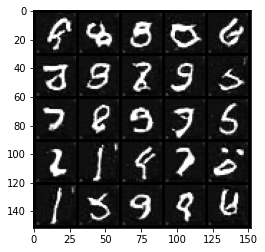

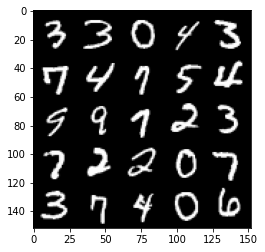

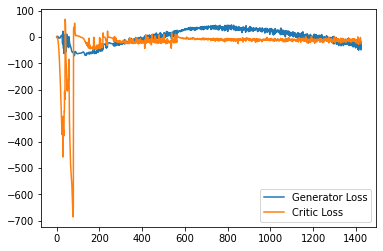

Epoch 61, step 29000: Generator loss: -30.652664322793484, critic loss: -11.469895509600644


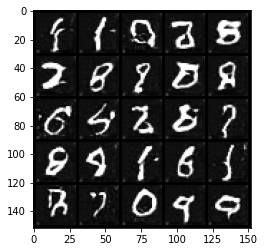

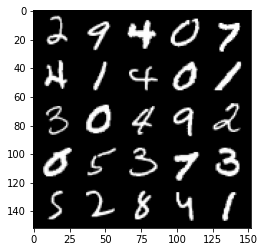

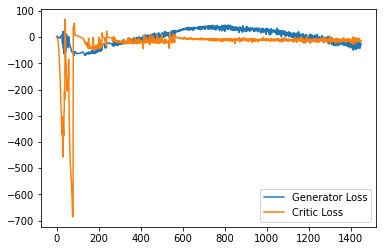

Epoch 62, step 29500: Generator loss: -35.27742294239998, critic loss: -13.691345623540881


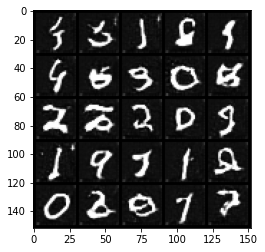

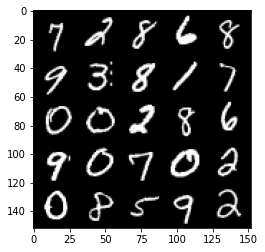

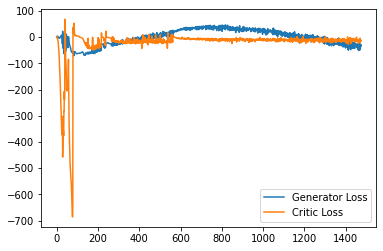

Epoch 63, step 30000: Generator loss: -37.69033256459236, critic loss: -11.566282497930528


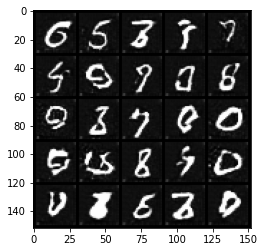

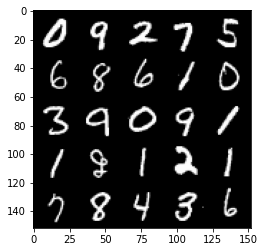

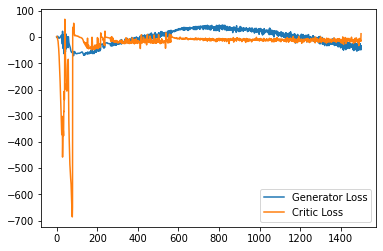

Epoch 65, step 30500: Generator loss: -41.001440268278124, critic loss: -13.152468889570224


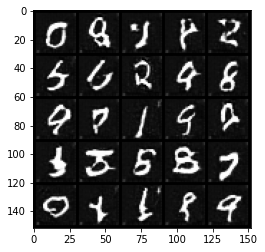

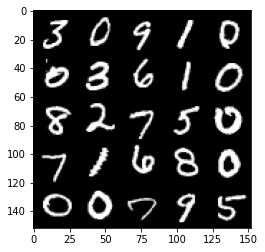

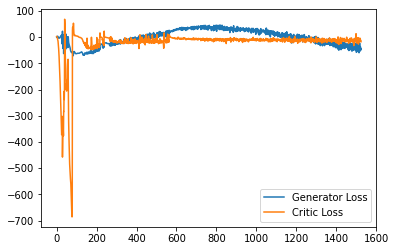

Epoch 66, step 31000: Generator loss: -39.87139762878418, critic loss: -12.266256636667254


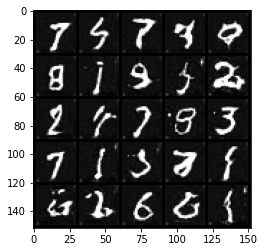

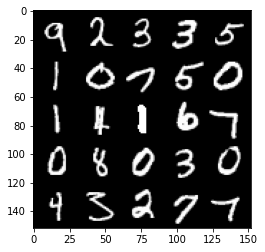

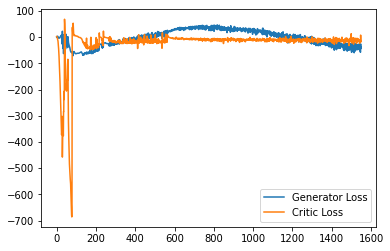

Epoch 67, step 31500: Generator loss: -47.26706701397896, critic loss: -12.308216301202778


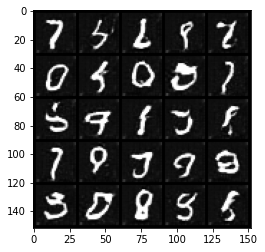

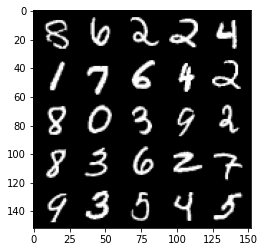

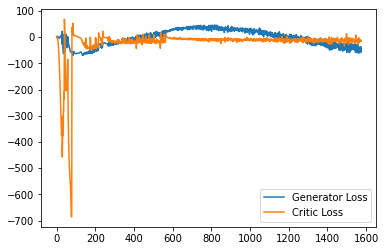

Epoch 68, step 32000: Generator loss: -47.247686646223066, critic loss: -12.072940995132937


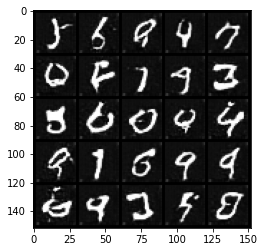

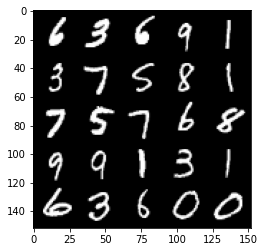

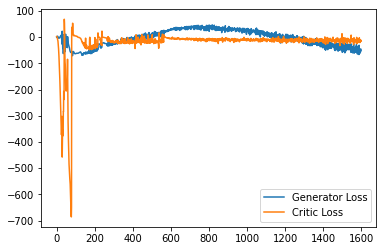

Epoch 69, step 32500: Generator loss: -47.891121042490006, critic loss: -10.197408145451547


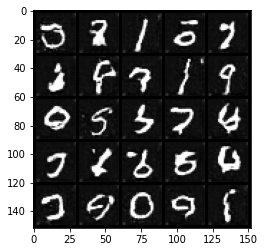

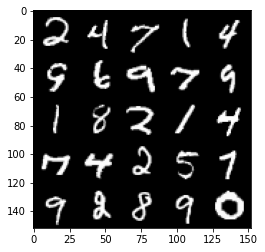

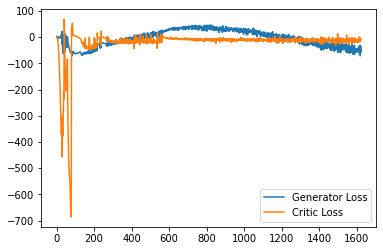

Epoch 70, step 33000: Generator loss: -48.75618479919434, critic loss: -10.46114129755497


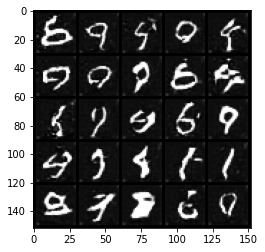

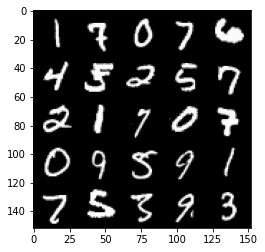

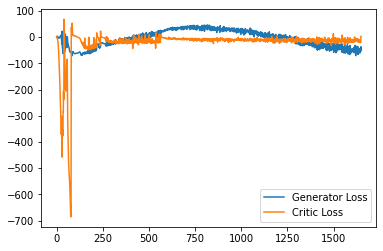

Epoch 71, step 33500: Generator loss: -54.306308986663815, critic loss: -9.639619665372374


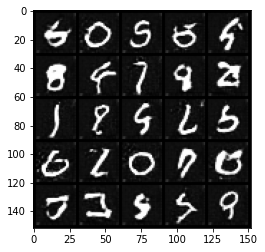

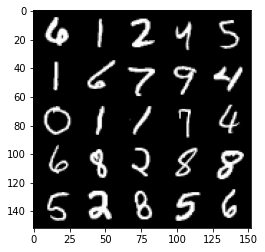

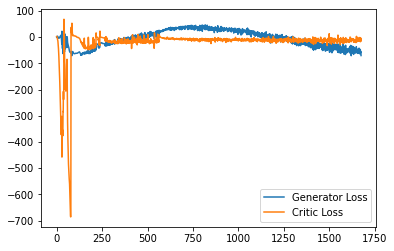

Epoch 72, step 34000: Generator loss: -57.09983953762055, critic loss: -10.064769744825353


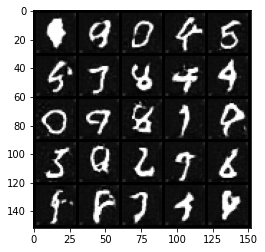

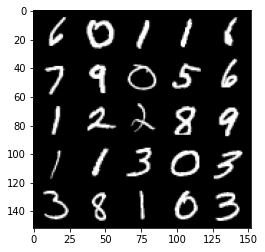

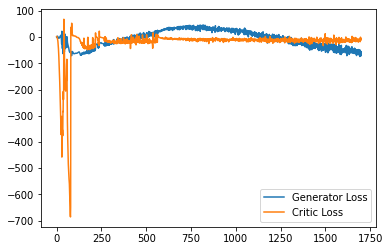

Epoch 73, step 34500: Generator loss: -64.81216633605958, critic loss: -12.121613642191885


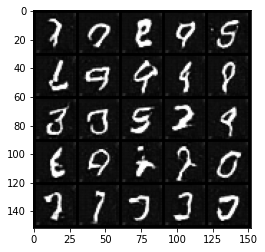

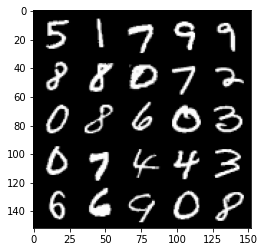

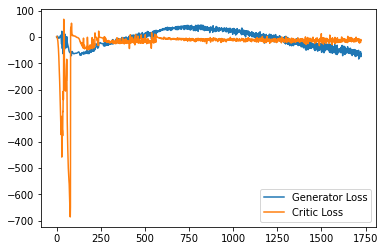

Epoch 74, step 35000: Generator loss: -64.55071668243409, critic loss: -9.491810277974597


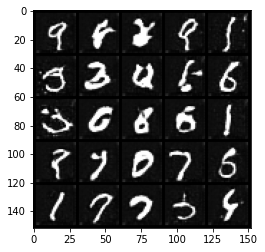

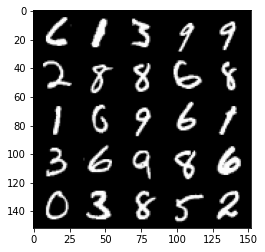

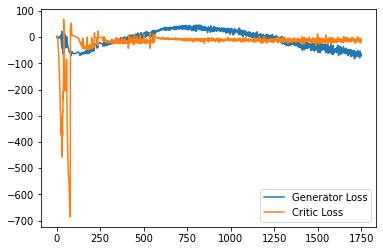

Epoch 75, step 35500: Generator loss: -65.41271456956864, critic loss: -13.110590693724161


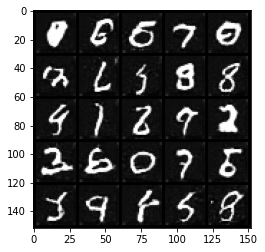

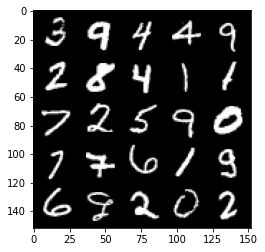

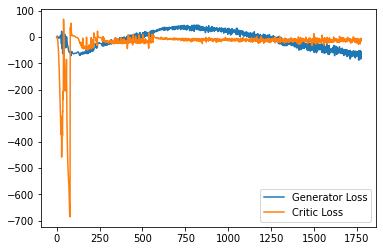

Epoch 76, step 36000: Generator loss: -67.75015356445313, critic loss: -9.13285972788334


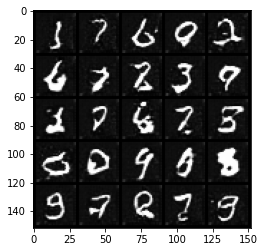

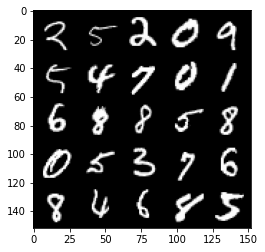

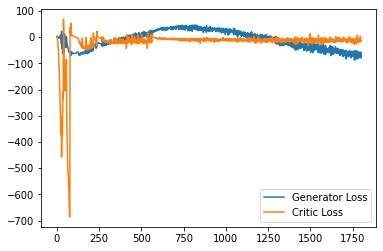

Epoch 77, step 36500: Generator loss: -72.06422605895996, critic loss: -11.630562951862814


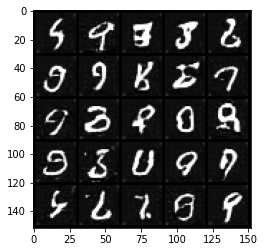

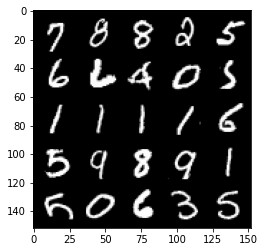

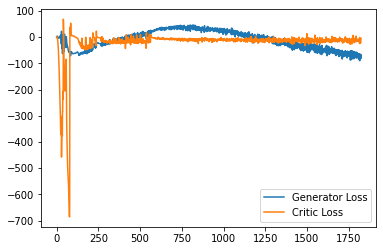

Epoch 78, step 37000: Generator loss: -75.40633739471436, critic loss: -11.827654527187352


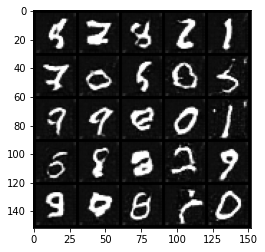

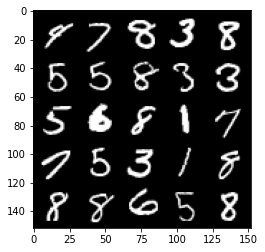

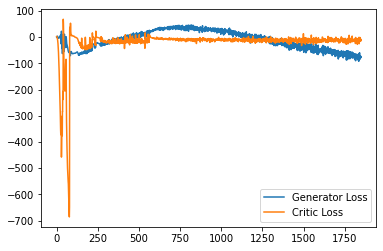

Epoch 79, step 37500: Generator loss: -76.32106256103516, critic loss: -12.725693193244938


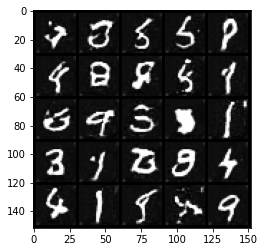

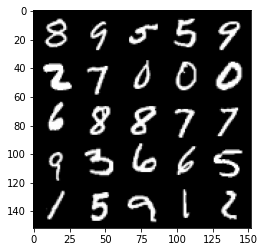

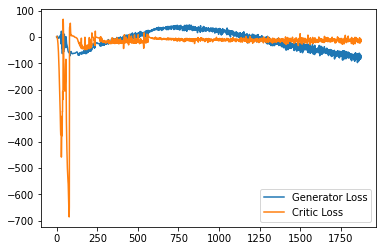

Epoch 81, step 38000: Generator loss: -76.26176611709595, critic loss: -12.048258613073816


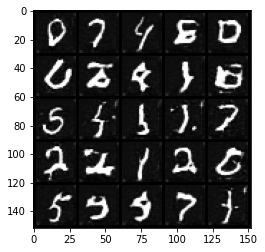

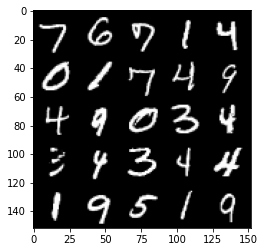

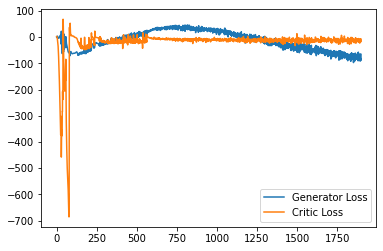

Epoch 82, step 38500: Generator loss: -75.91091901779174, critic loss: -12.014876578354828


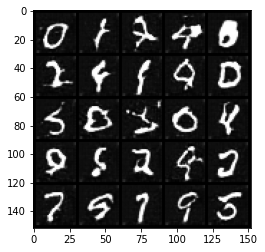

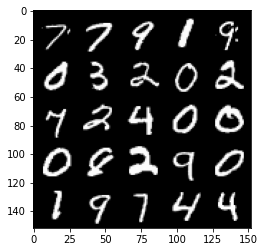

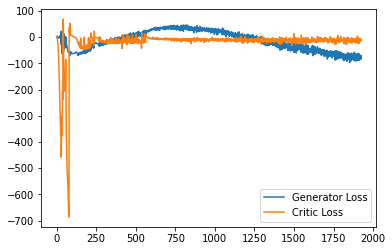

Epoch 83, step 39000: Generator loss: -78.34284988021851, critic loss: -11.577365063631538


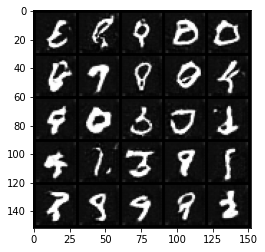

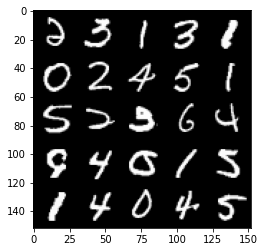

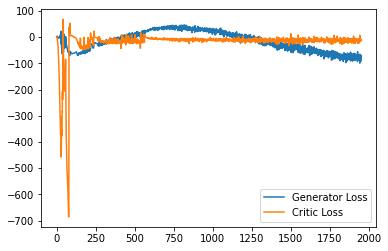

Epoch 84, step 39500: Generator loss: -77.03892515945435, critic loss: -7.945766945099832


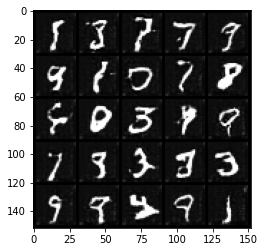

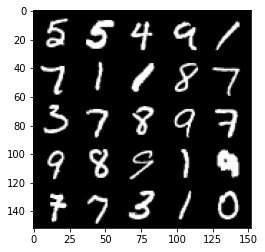

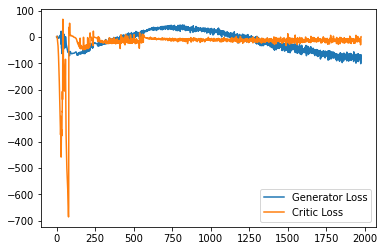

In [ ]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
